In [1]:
import pathlib
from pathlib import Path
import pandas as pd

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Thu_Jan_28_19:32:09_PST_2021
Cuda compilation tools, release 11.2, V11.2.142
Build cuda_11.2.r11.2/compiler.29558016_0
torch:  1.13 ; cuda:  1.13.0
detectron2: 0.6


In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
#setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [4]:
setup_logger()

<Logger detectron2 (DEBUG)>

In [5]:
import matplotlib as mpl
import matplotlib.pyplot as plt 

%matplotlib inline

In [6]:
#original_folder = "valladolid_merida_8clases_25Oct2022"
#tmp_str = "coco_" + purpose

In [7]:
from detectron2.data.datasets import register_coco_instances

f = Path.cwd() / ("coco_" + "train") 
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_train", {}, str(l), str(d))

In [8]:
MetadataCatalog.get("my_dataset_train")

namespace(name='my_dataset_train',
          json_file='/home/jose/darknet/coco_train/labels.json',
          image_root='/home/jose/darknet/coco_train/data',
          evaluator_type='coco')

In [9]:
f = Path.cwd() / ("coco_" + "test")
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_test", {}, str(l), str(d))

In [10]:
MetadataCatalog.get("my_dataset_test")

namespace(name='my_dataset_test',
          json_file='/home/jose/darknet/coco_test/labels.json',
          image_root='/home/jose/darknet/coco_test/data',
          evaluator_type='coco')

In [11]:
f = Path.cwd() / ("coco_" + "val")
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_val", {}, str(l), str(d))

In [12]:
MetadataCatalog.get("my_dataset_val")

namespace(name='my_dataset_val',
          json_file='/home/jose/darknet/coco_val/labels.json',
          image_root='/home/jose/darknet/coco_val/data',
          evaluator_type='coco')

WARNING [11/23 20:31:36 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/23 20:31:36 d2.data.datasets.coco]: Loaded 1935 images in COCO format from /home/jose/darknet/coco_train/labels.json
hi


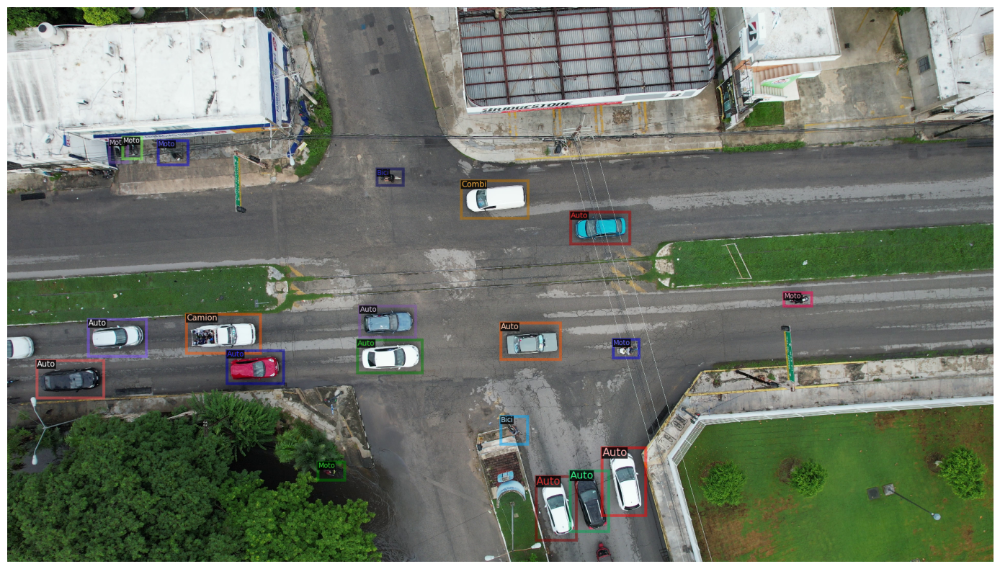

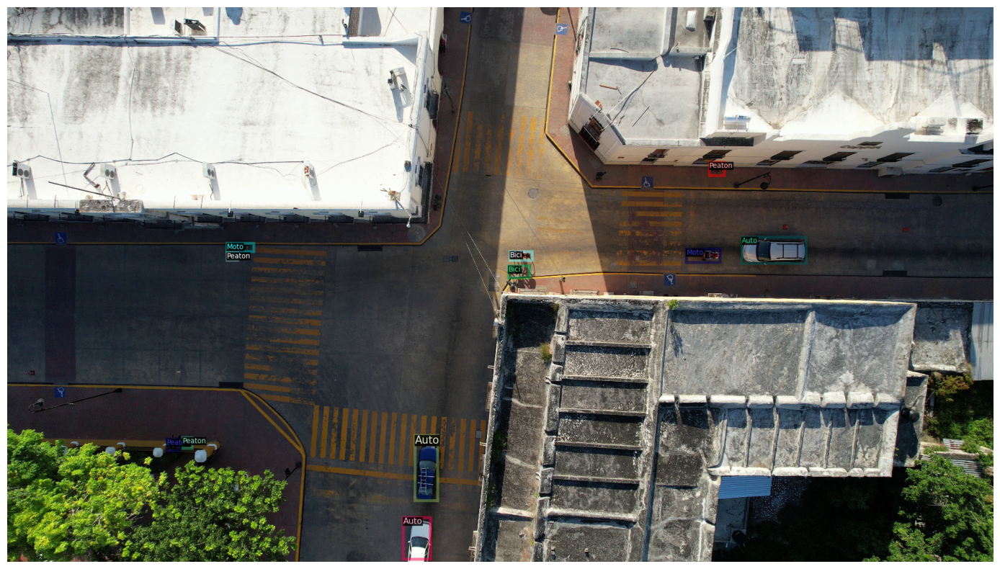

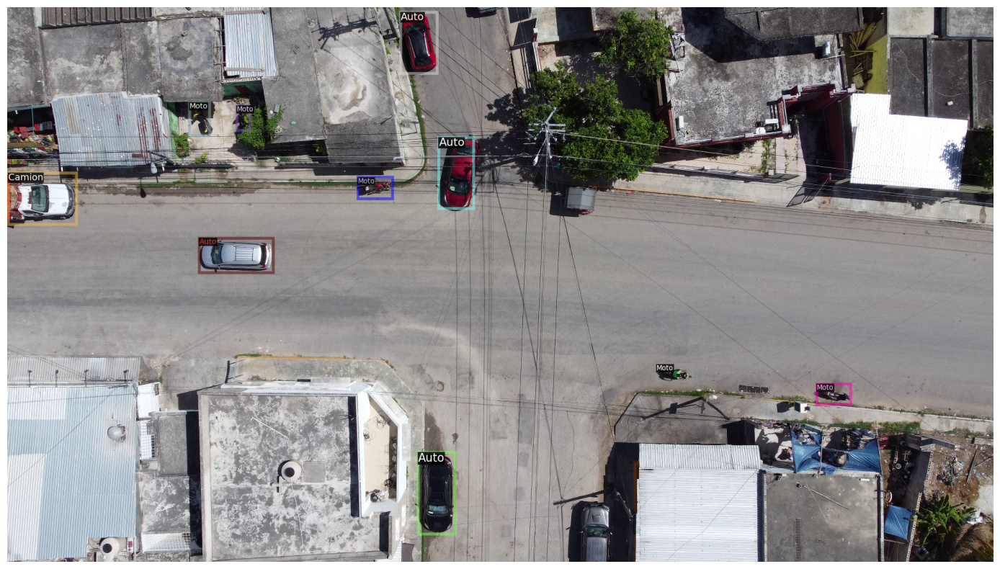

In [13]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")

dataset_dicts = DatasetCatalog.get("my_dataset_train")
print("hi")
import random
from detectron2.utils.visualizer import Visualizer


for d in random.sample(dataset_dicts, 3):
    
    img = cv2.imread(d["file_name"])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #print(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    #cv2_imshow(vis.get_image()[:, :, ::-1])
    #cv2.imshow("img", vis.get_image()[:, :, ::-1])
    #Image(d["file_name"])
    #Image(vis.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.margins(x=0)
    plt.show()

In [14]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [15]:
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 500 # va subiendo lr desde 0
cfg.SOLVER.MAX_ITER = 1800 #1500 #adjust up if val mAP is still rising, adjust down if overfit

cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05


cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 8 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 200

cfg.OUTPUT_DIR = "./output_2"


In [16]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/23 21:15:54 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

WARNING [11/23 21:15:55 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/23 21:15:55 d2.data.datasets.coco]: Loaded 1935 images in COCO format from /home/jose/darknet/coco_train/labels.json
[11/23 21:15:55 d2.data.build]: Removed 0 images with no usable annotations. 1935 images left.
[11/23 21:15:55 d2.data.build]: Distribution of instances among all 8 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    Auto    | 10668        |  Autobus   | 278          |    Bici    | 1255         |
|   Camion   | 2192         |   Combi    | 387          |    Moto    | 5304         |
|  MotoTaxi  | 301          |   Peaton   | 8994         |            |              |
|   total    | 29379        |            |              |            |              |
[11/23 21:15:55 d2.data.dataset_mapper]: [Datase

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (9, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (32, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (32,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

[11/23 21:15:58 d2.engine.train_loop]: Starting training from iteration 0


/home/jose/miniconda3/envs/f1/lib/python3.7/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1666643004612/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/23 21:16:36 d2.utils.events]:  eta: 0:51:17  iter: 19  total_loss: 3.765  loss_cls: 2.217  loss_box_reg: 0.6963  loss_rpn_cls: 0.6749  loss_rpn_loc: 0.2403  time: 1.7244  data_time: 0.0490  lr: 3.8962e-05  max_mem: 10900M
[11/23 21:17:10 d2.utils.events]:  eta: 0:50:52  iter: 39  total_loss: 2.838  loss_cls: 1.707  loss_box_reg: 0.7204  loss_rpn_cls: 0.113  loss_rpn_loc: 0.2454  time: 1.7153  data_time: 0.0107  lr: 7.8922e-05  max_mem: 10900M
[11/23 21:17:44 d2.utils.events]:  eta: 0:50:23  iter: 59  total_loss: 2.061  loss_cls: 0.9595  loss_box_reg: 0.743  loss_rpn_cls: 0.103  loss_rpn_loc: 0.2021  time: 1.7136  data_time: 0.0107  lr: 0.00011888  max_mem: 10900M
[11/23 21:18:19 d2.utils.events]:  eta: 0:49:55  iter: 79  total_loss: 1.875  loss_cls: 0.8131  loss_box_reg: 0.7906  loss_rpn_cls: 0.07521  loss_rpn_loc: 0.1692  time: 1.7202  data_time: 0.0090  lr: 0.00015884  max_mem: 10900M
[11/23 21:18:55 d2.utils.events]:  eta: 0:49:36  iter: 99  total_loss: 1.719  loss_cls: 0.7536  

[11/23 21:24:17 d2.utils.events]:  eta: 0:50:03  iter: 239  total_loss: 1.175  loss_cls: 0.4158  loss_box_reg: 0.5573  loss_rpn_cls: 0.03724  loss_rpn_loc: 0.1541  time: 1.8963  data_time: 0.0116  lr: 0.00047852  max_mem: 10900M
[11/23 21:24:59 d2.utils.events]:  eta: 0:49:42  iter: 259  total_loss: 1.183  loss_cls: 0.4191  loss_box_reg: 0.5844  loss_rpn_cls: 0.03738  loss_rpn_loc: 0.1401  time: 1.9099  data_time: 0.0110  lr: 0.00051848  max_mem: 10900M
[11/23 21:25:40 d2.utils.events]:  eta: 0:49:25  iter: 279  total_loss: 1.115  loss_cls: 0.372  loss_box_reg: 0.5246  loss_rpn_cls: 0.02987  loss_rpn_loc: 0.1847  time: 1.9201  data_time: 0.0097  lr: 0.00055844  max_mem: 10900M
[11/23 21:26:22 d2.utils.events]:  eta: 0:49:15  iter: 299  total_loss: 0.9943  loss_cls: 0.3252  loss_box_reg: 0.4855  loss_rpn_cls: 0.02656  loss_rpn_loc: 0.1352  time: 1.9317  data_time: 0.0110  lr: 0.0005984  max_mem: 10900M
[11/23 21:27:04 d2.utils.events]:  eta: 0:49:03  iter: 319  total_loss: 1.057  loss_c

[11/23 21:33:59 d2.utils.events]:  eta: 0:44:32  iter: 499  total_loss: 0.949  loss_cls: 0.2776  loss_box_reg: 0.4887  loss_rpn_cls: 0.0246  loss_rpn_loc: 0.1622  time: 1.9909  data_time: 0.0120  lr: 0.000998  max_mem: 10900M
[11/23 21:34:41 d2.utils.events]:  eta: 0:43:53  iter: 519  total_loss: 0.883  loss_cls: 0.2653  loss_box_reg: 0.4652  loss_rpn_cls: 0.01797  loss_rpn_loc: 0.1557  time: 1.9944  data_time: 0.0091  lr: 0.001  max_mem: 10900M
[11/23 21:35:22 d2.utils.events]:  eta: 0:43:20  iter: 539  total_loss: 0.8364  loss_cls: 0.2553  loss_box_reg: 0.4268  loss_rpn_cls: 0.01831  loss_rpn_loc: 0.1443  time: 1.9967  data_time: 0.0105  lr: 0.001  max_mem: 10900M
[11/23 21:36:04 d2.utils.events]:  eta: 0:42:44  iter: 559  total_loss: 0.944  loss_cls: 0.2778  loss_box_reg: 0.4771  loss_rpn_cls: 0.02164  loss_rpn_loc: 0.1664  time: 1.9999  data_time: 0.0104  lr: 0.001  max_mem: 10900M
[11/23 21:36:45 d2.utils.events]:  eta: 0:42:08  iter: 579  total_loss: 0.8595  loss_cls: 0.2357  los

[11/23 21:43:42 d2.utils.events]:  eta: 0:36:11  iter: 759  total_loss: 0.8165  loss_cls: 0.218  loss_box_reg: 0.4154  loss_rpn_cls: 0.01623  loss_rpn_loc: 0.124  time: 2.0226  data_time: 0.0103  lr: 0.001  max_mem: 10900M
[11/23 21:44:24 d2.utils.events]:  eta: 0:35:30  iter: 779  total_loss: 0.8993  loss_cls: 0.2384  loss_box_reg: 0.4665  loss_rpn_cls: 0.01819  loss_rpn_loc: 0.1338  time: 2.0237  data_time: 0.0112  lr: 0.001  max_mem: 10900M
WARNING [11/23 21:45:05 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/23 21:45:05 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_val/labels.json
[11/23 21:45:05 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/23 21:45:05 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>


[11/23 21:52:43 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/23 21:52:43 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/23 21:52:43 d2.data.common]: Serializing 242 elements to byte tensors and concatenating them all ...
[11/23 21:52:43 d2.data.common]: Serialized dataset takes 0.26 MiB
WARNING [11/23 21:52:43 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[11/23 21:52:43 d2.evaluation.evaluator]: Start inference on 242 batches
[11/23 21:52:46 d2.evaluation.evaluator]: Inference done 11/242. Dataloading: 0.0055 s/iter. Inference: 0.1422 s/iter. Eval: 0.0003 s/iter. Total: 0.1479 s/iter. ETA=0:00:34
[11/23 21:52:51 d2.evaluation.evaluator]: Inference done 41/242. Dataloading: 0.0274 s/iter. Inference: 0.1371 s/it

[11/23 22:00:24 d2.evaluation.evaluator]: Inference done 11/242. Dataloading: 0.0335 s/iter. Inference: 0.1251 s/iter. Eval: 0.0003 s/iter. Total: 0.1589 s/iter. ETA=0:00:36
[11/23 22:00:29 d2.evaluation.evaluator]: Inference done 41/242. Dataloading: 0.0439 s/iter. Inference: 0.1348 s/iter. Eval: 0.0003 s/iter. Total: 0.1791 s/iter. ETA=0:00:36
[11/23 22:00:34 d2.evaluation.evaluator]: Inference done 73/242. Dataloading: 0.0352 s/iter. Inference: 0.1347 s/iter. Eval: 0.0003 s/iter. Total: 0.1702 s/iter. ETA=0:00:28
[11/23 22:00:39 d2.evaluation.evaluator]: Inference done 103/242. Dataloading: 0.0343 s/iter. Inference: 0.1361 s/iter. Eval: 0.0003 s/iter. Total: 0.1708 s/iter. ETA=0:00:23
[11/23 22:00:44 d2.evaluation.evaluator]: Inference done 135/242. Dataloading: 0.0324 s/iter. Inference: 0.1347 s/iter. Eval: 0.0003 s/iter. Total: 0.1674 s/iter. ETA=0:00:17
[11/23 22:00:49 d2.evaluation.evaluator]: Inference done 164/242. Dataloading: 0.0334 s/iter. Inference: 0.1350 s/iter. Eval: 0.

[11/23 22:08:21 d2.evaluation.evaluator]: Inference done 134/242. Dataloading: 0.0298 s/iter. Inference: 0.1367 s/iter. Eval: 0.0003 s/iter. Total: 0.1668 s/iter. ETA=0:00:18
[11/23 22:08:26 d2.evaluation.evaluator]: Inference done 165/242. Dataloading: 0.0291 s/iter. Inference: 0.1364 s/iter. Eval: 0.0003 s/iter. Total: 0.1658 s/iter. ETA=0:00:12
[11/23 22:08:31 d2.evaluation.evaluator]: Inference done 198/242. Dataloading: 0.0263 s/iter. Inference: 0.1373 s/iter. Eval: 0.0003 s/iter. Total: 0.1640 s/iter. ETA=0:00:07
[11/23 22:08:37 d2.evaluation.evaluator]: Inference done 230/242. Dataloading: 0.0257 s/iter. Inference: 0.1373 s/iter. Eval: 0.0003 s/iter. Total: 0.1634 s/iter. ETA=0:00:01
[11/23 22:08:38 d2.evaluation.evaluator]: Total inference time: 0:00:38.669373 (0.163162 s / iter per device, on 1 devices)
[11/23 22:08:38 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:32 (0.137263 s / iter per device, on 1 devices)
[11/23 22:08:39 d2.evaluation.coco_evaluation]

[11/23 22:16:20 d2.evaluation.evaluator]: Total inference time: 0:00:39.202421 (0.165411 s / iter per device, on 1 devices)
[11/23 22:16:20 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:32 (0.137202 s / iter per device, on 1 devices)
[11/23 22:16:20 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[11/23 22:16:20 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[11/23 22:16:20 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[11/23 22:16:20 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[11/23 22:16:20 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.30 seconds.
[11/23 22:16:20 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[11/23 22:16:20 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 seconds.
 Average Precision  (AP

[11/23 22:23:58 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[11/23 22:23:58 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[11/23 22:23:58 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[11/23 22:23:58 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[11/23 22:23:58 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.10 seconds.
[11/23 22:23:58 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[11/23 22:23:58 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.529
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.836
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.564
 Average Precision  (AP) @[ IoU=0.50:

In [ ]:
# 21:15:54 - 22:23:58 1:10 hr aprox

In [27]:
!kill 3440674

In [21]:
%reload_ext tensorboard
%tensorboard --logdir output_2

Reusing TensorBoard on port 6007 (pid 3440515), started 0:15:41 ago. (Use '!kill 3440515' to kill it.)

In [28]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output_2

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [30]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output_2/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[11/24 00:37:43 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,8,3,3)         |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

WARNING [11/24 00:37:43 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/24 00:37:43 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 00:37:43 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_test/labels.json
[11/24 00:37:43 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/24 00:37:43 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/24 00:37:43 d2.data.common]: Serializing 242 elements to byte tensors and concatenating them all ...
[11/24 00:37:43 d2.data.common]: Serialized dataset takes 0.26 MiB
[11/24 00:37:43 d2.evaluation.evaluator]: Start inference on 242 batches
[11/24 00:37:45 d2.evaluation.ev

OrderedDict([('bbox',
              {'AP': 52.356674374426134,
               'AP50': 84.22170073314177,
               'AP75': 55.534215491158946,
               'APs': 5.159779948513128,
               'APm': 29.500020765730785,
               'APl': 58.79631466802693,
               'AP-Auto': 69.91673746143995,
               'AP-Autobus': 80.74025594381109,
               'AP-Bici': 15.990602944319985,
               'AP-Camion': 73.29564290405072,
               'AP-Combi': 67.05217836224692,
               'AP-Moto': 42.75442140685242,
               'AP-MotoTaxi': 48.2664154300841,
               'AP-Peaton': 20.83714054260386})])

In [31]:
#visualize test data
my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
test_dataset_dicts = DatasetCatalog.get("my_dataset_test")

import random
from detectron2.utils.visualizer import Visualizer


WARNING [11/24 00:50:19 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 00:50:19 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_test/labels.json


In [32]:
my_dataset_test_metadata

namespace(name='my_dataset_test',
          json_file='/home/jose/darknet/coco_test/labels.json',
          image_root='/home/jose/darknet/coco_test/data',
          evaluator_type='coco',
          thing_classes=['Auto',
                         'Autobus',
                         'Bici',
                         'Camion',
                         'Combi',
                         'Moto',
                         'MotoTaxi',
                         'Peaton'],
          thing_dataset_id_to_contiguous_id={0: 0,
                                             1: 1,
                                             2: 2,
                                             3: 3,
                                             4: 4,
                                             5: 5,
                                             6: 6,
                                             7: 7})

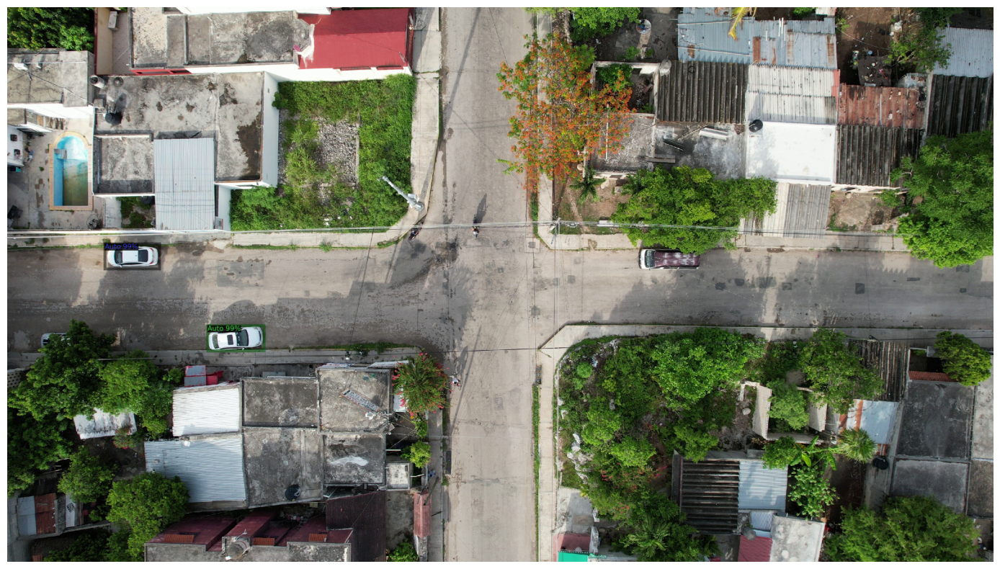

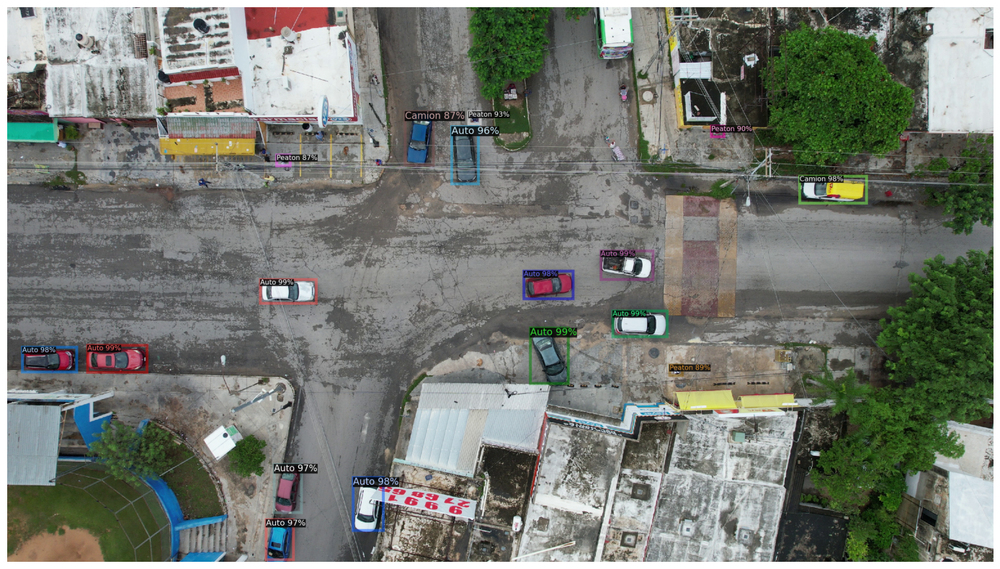

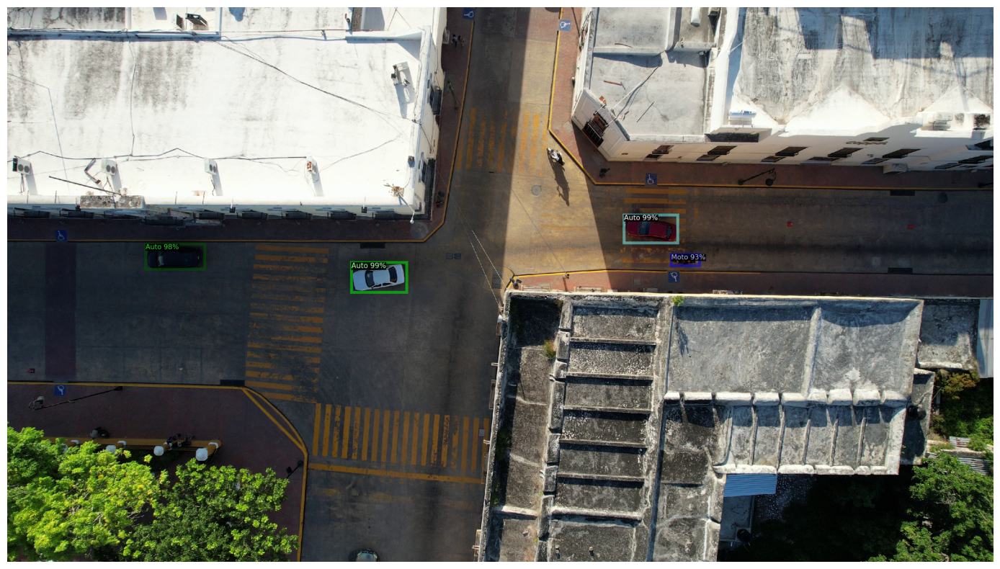

In [33]:
for d in random.sample(test_dataset_dicts, 3):
#for imageName in random.choices(test_imgs, k=3):
    print()
    #im = cv2.imread(imageName)
    im = cv2.imread(d["file_name"])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                metadata=my_dataset_test_metadata, 
                scale=0.8
                 )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #cv2_imshow(out.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.margins(x=0)
    plt.show()